In [15]:
data files;
length file $128;
rc = filename("myDir", "/folders/myfolders/Teesta/data");
/* Open the directory, get directory id number */
dirId = dopen("myDir");
if dirId > 0 then do;
    /* dnum() : nb of files in directory */
    do i = 1 to dnum(dirId);
        /* Read the ith file name from directory */
        file = dread(dirId, i);
        if length(file) > 0 then output;
        end;
    /* Close the open directory */
    rc = dclose(dirId);
    end;
drop rc dirId i;
run;

proc print; run;

Obs,file
1,nepal.csv
2,tumor.sas7bdat


In [17]:
libname t "/folders/myfolders/Teesta/data";
proc datasets library=t;
run;

In [19]:
proc contents data=t.TUMOR;
run;

In [35]:
proc sort data=t.TUMOR;
    by treatment mouse day;
run;

In [36]:
proc print data=t.TUMOR(where=(mouse=1));
run;

Obs,day,trt,Treatment,pcntvol,mouse
1,1,vehicle,0,100.000,1
2,2,vehicle,0,108.196,1
3,3,vehicle,0,117.961,1
4,4,vehicle,0,117.961,1
5,5,vehicle,0,122.941,1
6,6,vehicle,0,126.667,1
7,7,vehicle,0,135.686,1
8,8,vehicle,0,146.824,1
9,9,vehicle,0,148.455,1
10,10,vehicle,0,156.094,1


In [20]:
proc tabulate data=t.TUMOR missing;
    class trt;
    tables trt all,n;
run;

In [22]:
proc tabulate data=t.TUMOR missing;
    class day;
    tables day all,n;
run;

In [29]:
proc tabulate data=t.TUMOR missing;
    class mouse;
    tables mouse all,n;
run;


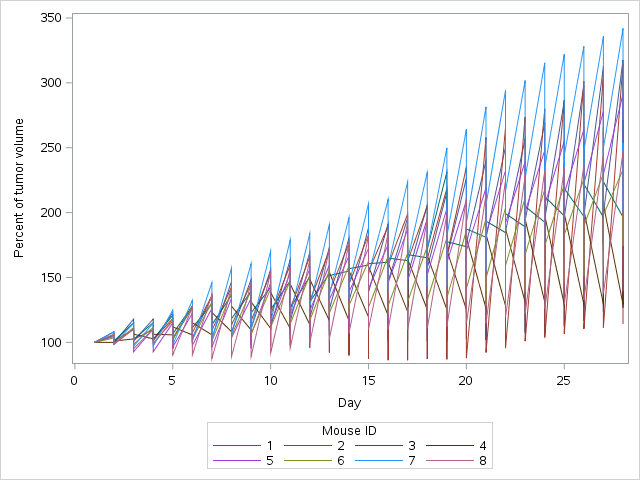

In [28]:
proc sort data=t.TUMOR;
    by mouse day;
run;
proc sgplot data=t.TUMOR;
    series x=day y=pcntvol/group=mouse;
run;



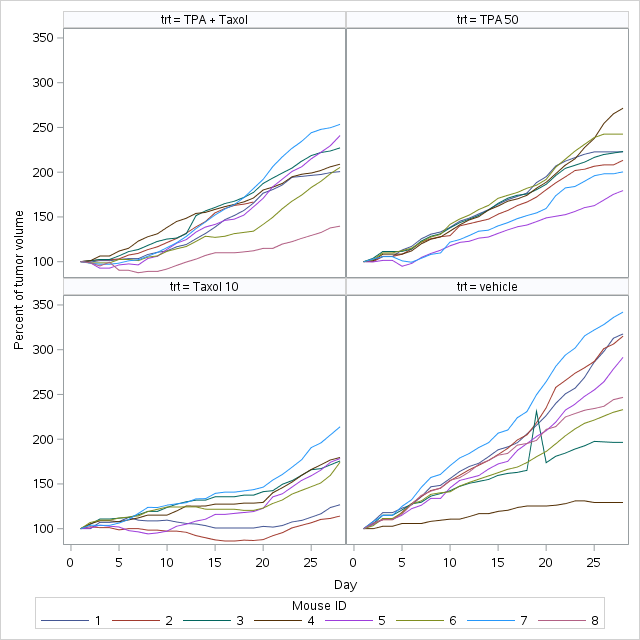

In [37]:
proc sgpanel data=t.TUMOR;
    panelby trt;
    series x=day y=pcntvol/group=mouse;
run;


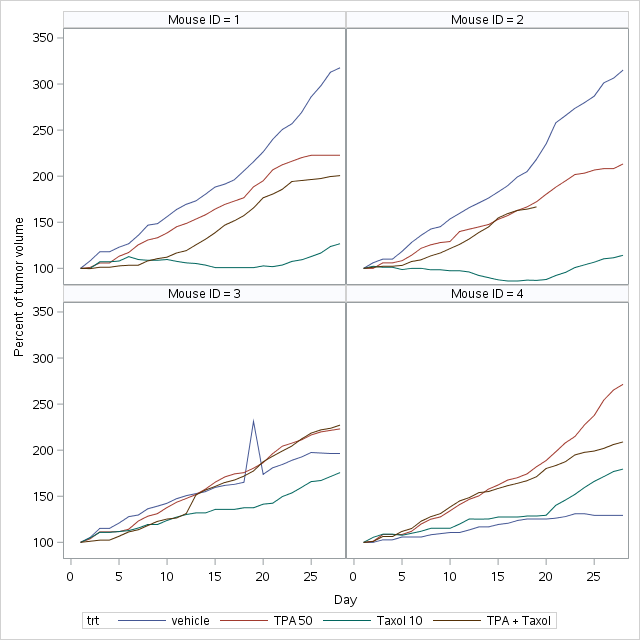
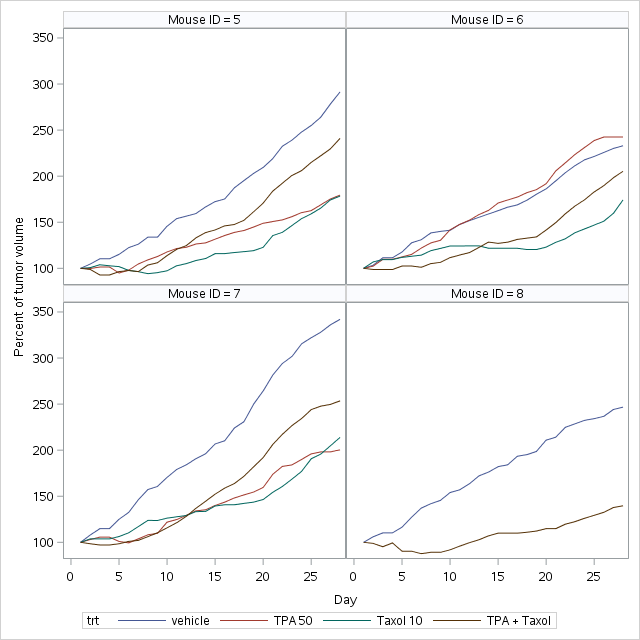

In [47]:
ods graphics on;
proc sgpanel data=t.TUMOR;
    panelby mouse;
    series x=day y=pcntvol/group=trt;
run;
ods graphics off;


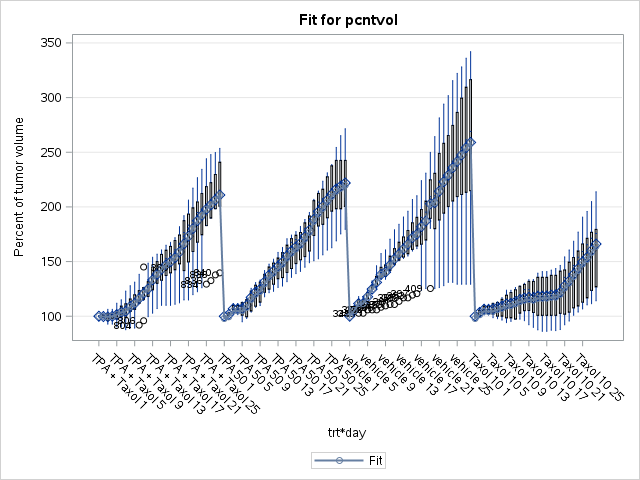
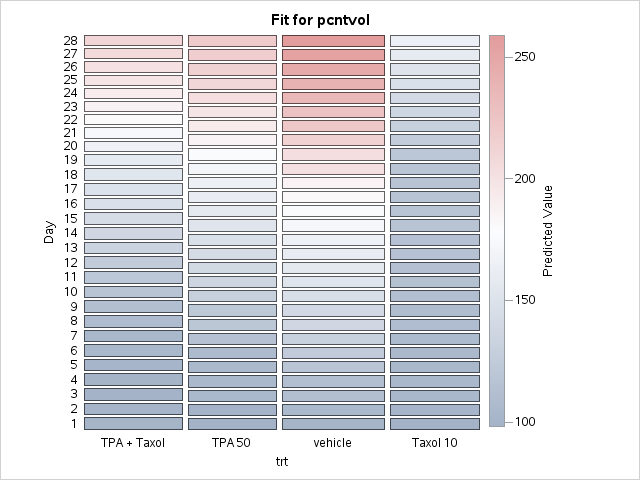
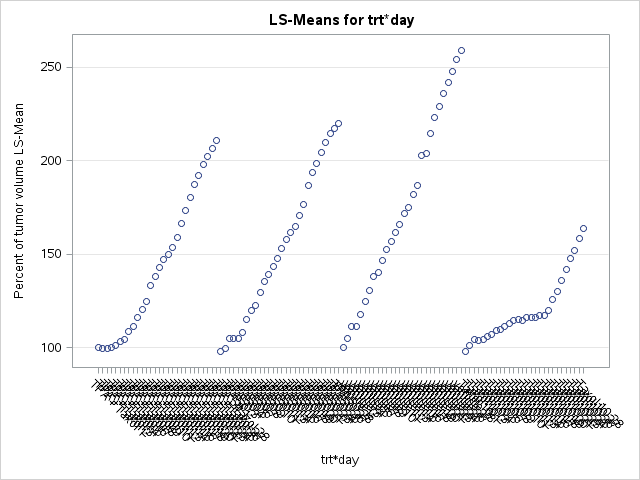
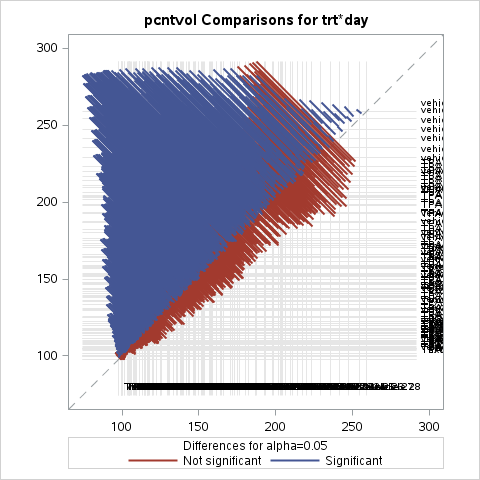

In [107]:
ods graphics on;
proc gee data=t.TUMOR plots=all;
    class mouse trt(ref='Taxol 10') day;
    model pcntvol = trt day trt*day;
    repeated subject=mouse /type=exch covb corrw modelse;
    effectplot contour;
    effectplot box;
    effectplot fit;
    effectplot interaction;
    effectplot mosaic;
    effectplot slicefit;
    lsmeans trt*day;
    lsmestimate day 'day' 0 -1 0 0 0 0 0 0 0 0 0 0 0 0 0.33 0 0 0 0 0.33 0 0 0 0 0 0 0 0.34;
    lsmestimate day 'day  2 and 15' 0 -1 0 0 0 0 0 0 0 0 0 0 0 0  1 0 0 0 0  0 0 0 0 0 0 0 0 0;
    lsmestimate day 'day  2 and 20' 0 -1 0 0 0 0 0 0 0 0 0 0 0 0  0 0 0 0 0  1 0 0 0 0 0 0 0 0;
    lsmestimate day 'day  2 and 28' 0 -1 0 0 0 0 0 0 0 0 0 0 0 0  0 0 0 0 0  0 0 0 0 0 0 0 0 1;
    lsmestimate day 'day 15 and 20' 0  0 0 0 0 0 0 0 0 0 0 0 0 0 -1 0 0 0 0  1 0 0 0 0 0 0 0 0;
    lsmestimate day 'day 15 and 28' 0  0 0 0 0 0 0 0 0 0 0 0 0 0 -1 0 0 0 0  0 0 0 0 0 0 0 0 1;
    lsmestimate day 'day 20 and 28' 0  0 0 0 0 0 0 0 0 0 0 0 0 0  0 0 0 0 0 -1 0 0 0 0 0 0 0 1;
    lsmestimate day 'day 20 & 28 p' [-1,20] [1,28];
    lsmestimate trt*day "trt*day day 2 vrs 15" [-1,1 2] [-1,2 2] [-1,3 2] [1,1 15] [1,2 15] [1,3 15] /E divisor=3;
    lsmestimate trt*day "trt*day day 2 vrs 20" [-1,1 2] [-1,2 2] [-1,3 2] [1,1 20] [1,2 20] [1,3 20] /E divisor=3;
    lsmestimate trt*day "trt*day day 2 vrs 20" 
                                               [-1,1 2] [-1,2 2] [-1,3 2] [1,1 15] [1,2 15] [1,3 15],
                                               [-1,1 2] [-1,2 2] [-1,3 2] [1,1 20] [1,2 20] [1,3 20],
                                               [-1,1 2] [-1,2 2] [-1,3 2] [1,1 28] [1,2 28] [1,3 28],
                                               
                                               [-1,1 2] [-1,2 2] [-1,3 2] [1,1 15] [1,2 15] [1,3 15],
                                               [-1,1 15] [-1,2 15] [-1,3 15] [1,1 20] [1,2 20] [1,3 20],
                                               [-1,1 15] [-1,2 15] [-1,3 15] [1,1 28] [1,2 28] [1,3 28],
                                               
                                               [-1,1 20] [-1,2 20] [-1,3 20] [1,1 28] [1,2 28] [1,3 28]
    /E divisor=3 joint;
run;
ods graphics off;

In [125]:
proc nlmixed data=t.TUMOR;
     pred = b0 + u + b1*(trt='Taxol 10') + b2*(trt='vehicle') + b3*(trt='TPA 50') + b4*(trt='TPA + Taxol');
     model pcntvol ~ normal(pred,s2);
     random u ~ normal(0,s2u) subject=mouse;
run;

In [127]:
proc nlmixed data=t.TUMOR;
     pred = b0 + u + b1*(trt='Taxol 10') + b2*(trt='vehicle') + b3*(trt='TPA 50') + b4*(trt='TPA + Taxol');
     q = log(pcntvol);
     model q ~ normal(pred,s2);
     random u ~ normal(0,s2u) subject=mouse;
run;

In [121]:
proc gee data=t.TUMOR plots=all;
    class mouse trt(ref='Taxol 10') day;
    model pcntvol = trt day trt*day;
    repeated subject=mouse(trt) /type=exch covb corrw modelse within=day ;
    
run;


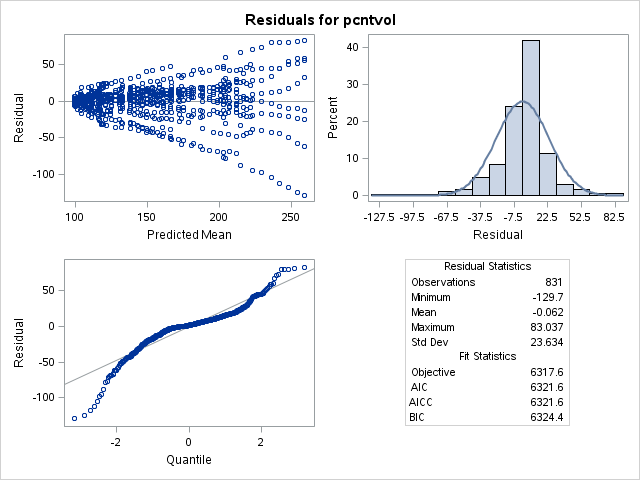
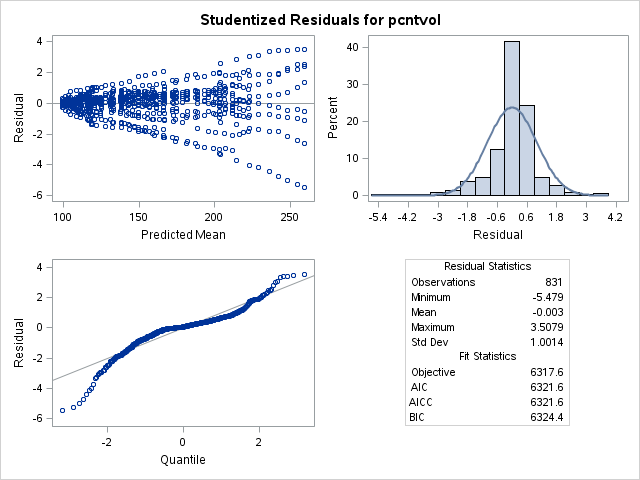
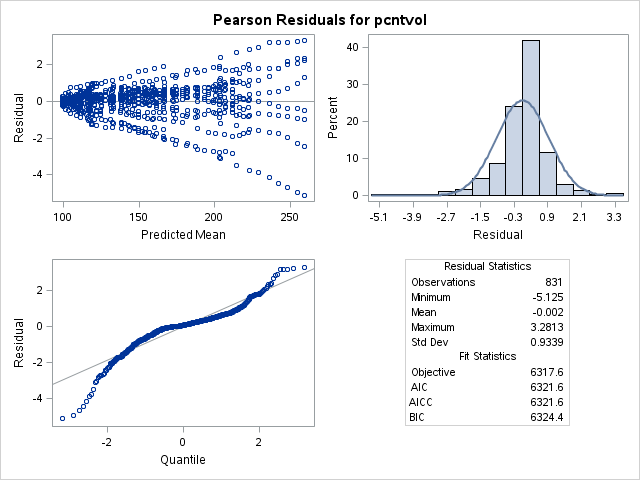
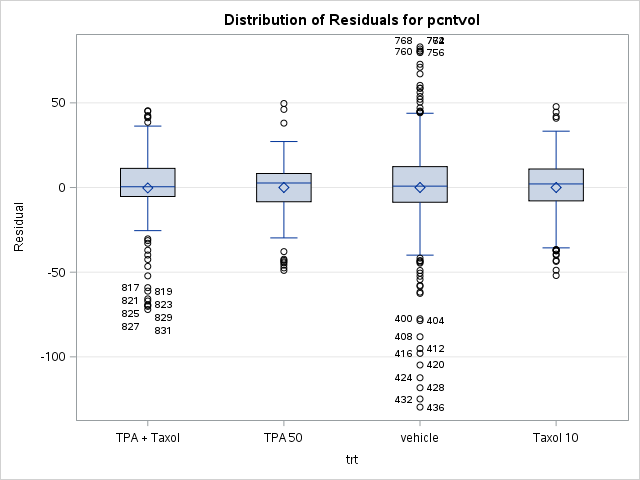
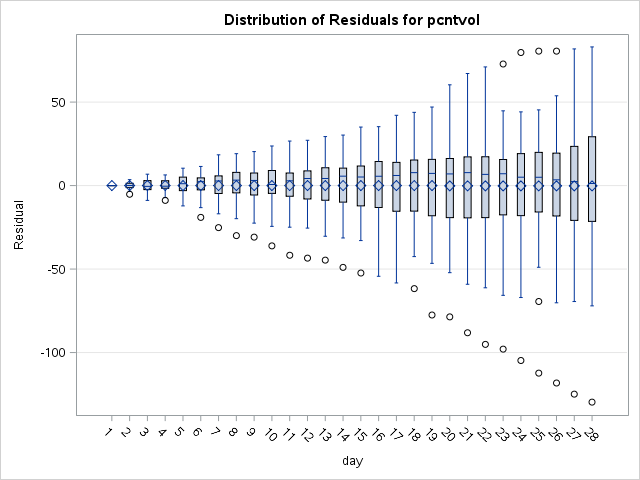
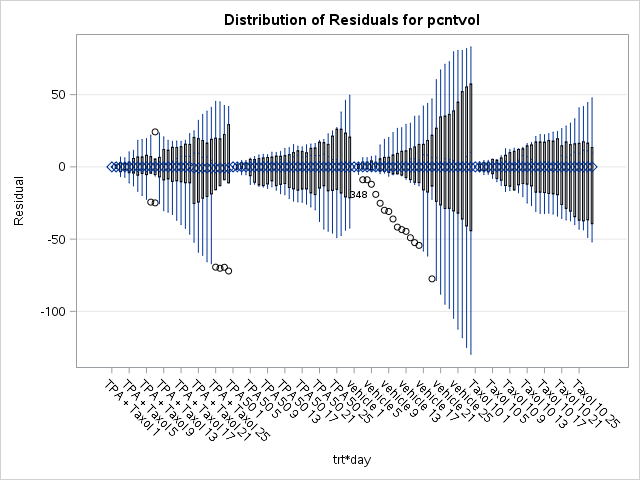
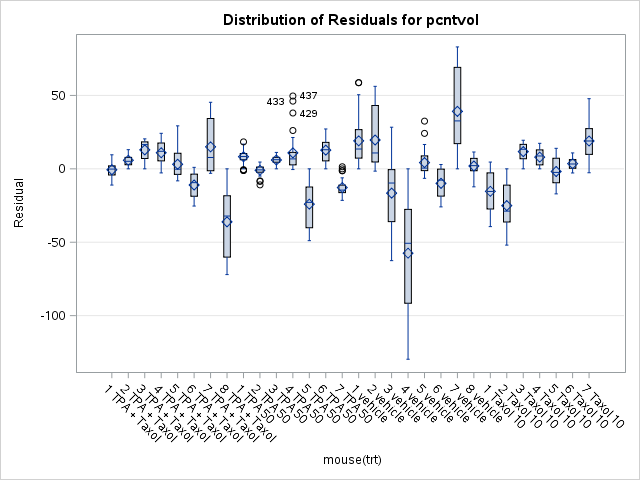

In [118]:
ods graphics on;
proc mixed data=t.TUMOR plots=all;
    class mouse trt(ref='Taxol 10') day;
    model pcntvol = trt day trt*day;
    repeated  day/subject=mouse(trt) type = cs;
    lsmeans trt*day/slice=day adjust=bon;
    lsmeans trt*day/slice=trt slicediff=trt adjust=bon;
    store tumorModel;
run;
ods graphics off;

In [113]:
proc plm source=tumorModel;
    lsmestimate trt*day "TRT*DAy" [1,1 1] [-1,2 1];
run;

In [ ]:
proc dddd